In [34]:
import requests
import pandas as pd
import json
import numpy as np
req = requests.get('https://api.covid19api.com/live/country/united-states').json()
covid = pd.DataFrame(req)

In [35]:
covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6061 entries, 0 to 6060
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   ID           6061 non-null   object
 1   Country      6061 non-null   object
 2   CountryCode  6061 non-null   object
 3   Province     6061 non-null   object
 4   City         6061 non-null   object
 5   CityCode     6061 non-null   object
 6   Lat          6061 non-null   object
 7   Lon          6061 non-null   object
 8   Confirmed    6061 non-null   int64 
 9   Deaths       6061 non-null   int64 
 10  Recovered    6061 non-null   int64 
 11  Active       6061 non-null   int64 
 12  Date         6061 non-null   object
dtypes: int64(4), object(9)
memory usage: 615.7+ KB


In [36]:
covid.describe()

,Confirmed,Deaths,Recovered,Active
count,6.061000e+03,6061.000000,6061.0,6.061000e+03
mean,6.882610e+05,11601.371391,0.0,6.766596e+05
std,8.389894e+05,14491.249485,0.0,8.249433e+05
min,0.000000e+00,0.000000,0.0,0.000000e+00
25%,1.400580e+05,2079.000000,0.0,1.378350e+05
50%,4.620780e+05,7284.000000,0.0,4.538920e+05
75%,8.416000e+05,13963.000000,0.0,8.293270e+05
max,4.791825e+06,70201.000000,0.0,4.721624e+06


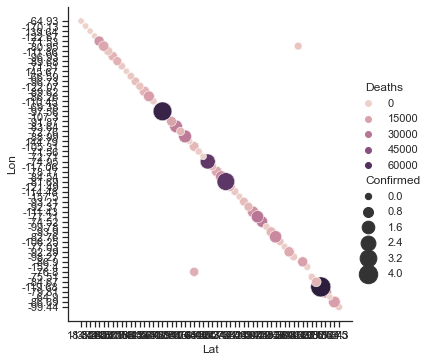

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="ticks")
sns.relplot(data=covid,x="Lat",y="Lon",hue="Deaths",size="Confirmed",sizes=(40,400))

In [38]:
covid["Lat"][0]

'18.35'

In [39]:
covid["Lat"]=covid["Lat"].astype("float16")
covid["Lon"]=covid["Lon"].astype("float16")

In [40]:
covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6061 entries, 0 to 6060
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ID           6061 non-null   object 
 1   Country      6061 non-null   object 
 2   CountryCode  6061 non-null   object 
 3   Province     6061 non-null   object 
 4   City         6061 non-null   object 
 5   CityCode     6061 non-null   object 
 6   Lat          6061 non-null   float16
 7   Lon          6061 non-null   float16
 8   Confirmed    6061 non-null   int64  
 9   Deaths       6061 non-null   int64  
 10  Recovered    6061 non-null   int64  
 11  Active       6061 non-null   int64  
 12  Date         6061 non-null   object 
dtypes: float16(2), int64(4), object(7)
memory usage: 544.7+ KB


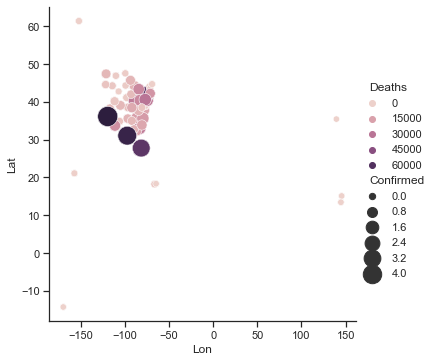

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="ticks")
fig=sns.relplot(data=covid,x="Lon", y="Lat", hue="Deaths", size="Confirmed", sizes=(40,400))

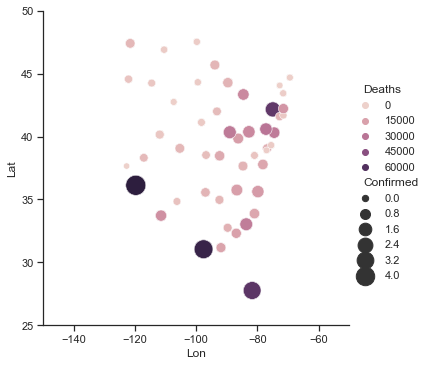

In [42]:
fig=sns.relplot(data=covid,x="Lon", y="Lat", hue="Deaths", size="Confirmed", sizes=(40,400)).set(ylim=(25,50),xlim=(-150,-50))

In [43]:
req = requests.get("https://www.communitybenefitinsight.org/api/get_hospitals.php").json()
hospitals = pd.DataFrame(req)
hospitals.head()

,hospital_id,hospital_org_id,ein,name,name2,name3,street_address,city,state,zip_code,...,fips_state_and_county_code,hospital_bed_count,chrch_affl_f,urban_location_f,children_hospital_f,memb_counc_teach_hosps_f,medicare_provider_number,county,hospital_bed_size,updated_dt
0,1,1,630307951,Mizell Memorial Hospital,,Mizell Memorial Hospital,702 Main Street,Opp,AL,36462,...,01039,99,N,N,N,N,010007,Covington County,<100 beds,"October 1, 2021"
1,2,2,630578923,St Vincents East,,St Vincents East,50 Medical Park Drive East,Birmingham,AL,35235,...,01073,362,N,Y,N,Y,010011,Jefferson County,>299 beds,"October 1, 2021"
2,3,3,630312913,Shelby Baptist Medical Center,,Shelby Baptist Medical Center,1000 First Street North,Alabaster,AL,35007,...,01117,252,N,Y,N,N,010016,Shelby County,100-299 beds,"October 1, 2021"
3,4,4,630459034,Callahan Eye Foundation Hosp,,Callahan Eye Foundation Hosp,1720 University Boulevard,Birmingham,AL,35233,...,01073,106,N,Y,N,Y,010018,Jefferson County,100-299 beds,"October 1, 2021"
4,5,5,581973570,Cherokee Medical Center,,Cherokee Medical Center,100 Northwood Drive,Centre,AL,35960,...,01019,60,N,N,N,N,010022,Cherokee County,<100 beds,"October 1, 2021"


In [44]:
hospitals['state_county']=hospitals['state']+'_'+hospitals['county']
hospitals.head()

,hospital_id,hospital_org_id,ein,name,name2,name3,street_address,city,state,zip_code,...,hospital_bed_count,chrch_affl_f,urban_location_f,children_hospital_f,memb_counc_teach_hosps_f,medicare_provider_number,county,hospital_bed_size,updated_dt,state_county
0,1,1,630307951,Mizell Memorial Hospital,,Mizell Memorial Hospital,702 Main Street,Opp,AL,36462,...,99,N,N,N,N,010007,Covington County,<100 beds,"October 1, 2021",AL_Covington County
1,2,2,630578923,St Vincents East,,St Vincents East,50 Medical Park Drive East,Birmingham,AL,35235,...,362,N,Y,N,Y,010011,Jefferson County,>299 beds,"October 1, 2021",AL_Jefferson County
2,3,3,630312913,Shelby Baptist Medical Center,,Shelby Baptist Medical Center,1000 First Street North,Alabaster,AL,35007,...,252,N,Y,N,N,010016,Shelby County,100-299 beds,"October 1, 2021",AL_Shelby County
3,4,4,630459034,Callahan Eye Foundation Hosp,,Callahan Eye Foundation Hosp,1720 University Boulevard,Birmingham,AL,35233,...,106,N,Y,N,Y,010018,Jefferson County,100-299 beds,"October 1, 2021",AL_Jefferson County
4,5,5,581973570,Cherokee Medical Center,,Cherokee Medical Center,100 Northwood Drive,Centre,AL,35960,...,60,N,N,N,N,010022,Cherokee County,<100 beds,"October 1, 2021",AL_Cherokee County


In [45]:
HospitalInfoPerCounty=hospitals.groupby(['state_county'], as_index=False)['hospital_bed_count'].agg('sum')
HospitalInfoPerCounty.head()

,state_county,hospital_bed_count
0,AK_Anchorage Municipality,401
1,AK_Fairbanks North Star Borough,162
2,AK_Kenai Peninsula Borough,49622
3,AK_Ketchikan Gateway Borough,25
4,AK_Kodiak Island Borough,25


In [46]:
HospitalInfoPerCounty=hospitals.groupby(['state_county'], as_index=False)['hospital_bed_count'].agg('sum')
HospitalInfoPerCounty.head()


,state_county,hospital_bed_count
0,AK_Anchorage Municipality,401
1,AK_Fairbanks North Star Borough,162
2,AK_Kenai Peninsula Borough,49622
3,AK_Ketchikan Gateway Borough,25
4,AK_Kodiak Island Borough,25


In [47]:
HospitalInfoPerCounty['state_county']=HospitalInfoPerCounty['state_county'].str.replace(' County','')
HospitalInfoPerCounty.head(5)

,state_county,hospital_bed_count
0,AK_Anchorage Municipality,401
1,AK_Fairbanks North Star Borough,162
2,AK_Kenai Peninsula Borough,49622
3,AK_Ketchikan Gateway Borough,25
4,AK_Kodiak Island Borough,25


In [48]:
us_state_to_abbrev = {
"Alabama": "AL","Alaska": "AK","Arizona": "AZ","Arkansas": "AR", "California": "CA",
"Colorado": "CO","Connecticut": "CT","Delaware": "DE","Florida": "FL","Georgia": "GA",
"Hawaii": "HI","Idaho": "ID","Illinois": "IL","Indiana": "IN","Iowa": "IA","Kansas": "KS",
"Kentucky": "KY","Louisiana": "LA","Maine": "ME","Maryland": "MD","Massachusetts": "MA",
"Michigan": "MI","Minnesota": "MN","Mississippi": "MS","Missouri": "MO","Montana": "MT",
"Nebraska": "NE","Nevada": "NV","New Hampshire": "NH","New Jersey": "NJ","New Mexico": "NM",
"New York": "NY","North Carolina": "NC","North Dakota": "ND","Ohio": "OH",
"Oklahoma": "OK","Oregon": "OR","Pennsylvania": "PA","Rhode Island": "RI",
"South Carolina": "SC","South Dakota": "SD","Tennessee": "TN","Texas": "TX",
"Utah": "UT","Vermont": "VT","Virginia": "VA","Washington": "WA",
"West Virginia": "WV","Wisconsin": "WI","Wyoming": "WY",
"District of Columbia": "DC","American Samoa": "AS","Guam": "GU", "Northern Mariana Islands": "MP",
"Puerto Rico": "PR","United States Minor Outlying Islands": "UM","U.S. Virgin Islands": "VI",
}
covid['state'].replace(us_state_to_abbrev, inplace=True)
covid.head(5)

KeyError: 'state'

In [ ]:
import requests
import pandas as pd
import json
import numpy as np
req=requests.get("https://webhooks.mongodb-stitch.com/api/client/v2.0/app/covid-19-qppza/service/REST-API/incoming_webhook/us_only?min_date=2021-01-15T00:00:00.000Z&max_date=2021-01-15T00:00:00.000Z").json()
covid=pd.DataFrame(req)

In [ ]:
covid['state_county']=covid['state']+'_'+covid['county']
covid.head()

,_id,uid,country_iso2,country_iso3,country_code,fips,county,state,country,combined_name,population,loc,date,confirmed,deaths,confirmed_daily,deaths_daily,state_county
0,6166a80e9c89c0313b0a2751,84001001,US,USA,840,1001.0,Autauga,Alabama,US,"Autauga, Alabama, US",55869.0,"{'type': 'Point', 'coordinates': [-86.6441, 32...",2021-01-15T00:00:00.000Z,5103,55,28,0,Alabama_Autauga
1,6166a80e9c89c0313b0a29c7,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,"Baldwin, Alabama, US",223234.0,"{'type': 'Point', 'coordinates': [-87.7221, 30...",2021-01-15T00:00:00.000Z,16002,179,161,2,Alabama_Baldwin
2,6166a80e9c89c0313b0a2c3d,84001005,US,USA,840,1005.0,Barbour,Alabama,US,"Barbour, Alabama, US",24686.0,"{'type': 'Point', 'coordinates': [-85.3871, 31...",2021-01-15T00:00:00.000Z,1712,36,16,0,Alabama_Barbour
3,6166a80e9c89c0313b0a2eb3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,"Bibb, Alabama, US",22394.0,"{'type': 'Point', 'coordinates': [-87.1251, 32...",2021-01-15T00:00:00.000Z,2130,47,17,0,Alabama_Bibb
4,6166a80e9c89c0313b0a3129,84001009,US,USA,840,1009.0,Blount,Alabama,US,"Blount, Alabama, US",57826.0,"{'type': 'Point', 'coordinates': [-86.5679, 33...",2021-01-15T00:00:00.000Z,5264,83,45,3,Alabama_Blount


In [ ]:
CovidPerCounty=covid.groupby(['state_county'], as_index=False).agg({'deaths':'sum','confirmed':'sum','population':'sum','confirmed_daily':'mean','deaths_daily':'mean'})
CovidPerCounty.head(15)


,state_county,deaths,confirmed,population,confirmed_daily,deaths_daily
0,Alabama_Autauga,55,5103,55869.0,28,0
1,Alabama_Baldwin,179,16002,223234.0,161,2
2,Alabama_Barbour,36,1712,24686.0,16,0
3,Alabama_Bibb,47,2130,22394.0,17,0
4,Alabama_Blount,83,5264,57826.0,45,3
5,Alabama_Bullock,28,981,10101.0,10,0
6,Alabama_Butler,58,1679,19448.0,10,0
7,Alabama_Calhoun,200,10982,113605.0,119,3
8,Alabama_Chambers,69,2778,33254.0,21,0
9,Alabama_Cherokee,30,1596,26196.0,13,0


In [ ]:
CovidPerCounty['mortality']=CovidPerCounty['deaths']/CovidPerCounty['confirmed']
CovidPerCounty.head(5)

,state_county,deaths,confirmed,population,confirmed_daily,deaths_daily,mortality
0,Alabama_Autauga,55,5103,55869.0,28,0,0.010778
1,Alabama_Baldwin,179,16002,223234.0,161,2,0.011186
2,Alabama_Barbour,36,1712,24686.0,16,0,0.021028
3,Alabama_Bibb,47,2130,22394.0,17,0,0.022066
4,Alabama_Blount,83,5264,57826.0,45,3,0.015767


In [ ]:
Hospital_Covid_PerCounty=pd.merge(HospitalInfoPerCounty,CovidPerCounty,on='state_county')
Hospital_Covid_PerCounty=Hospital_Covid_PerCounty[Hospital_Covid_PerCounty['population']>50000]
Hospital_Covid_PerCounty=Hospital_Covid_PerCounty[Hospital_Covid_PerCounty['population']<300000]
Hospital_Covid_PerCounty=Hospital_Covid_PerCounty[Hospital_Covid_PerCounty['confirmed']>10]
Hospital_Covid_PerCounty.head()

,state_county,hospital_bed_count,deaths,confirmed,population,confirmed_daily,deaths_daily,mortality


In [ ]:
fig=sns.relplot(data=Hospital_Covid_PerCounty,x="people_per_bed", y="mortality", hue="Confirmed", size=population"", sizes=(40,400)).set(ylim=(0,0.06),xlim=(0,0.06))

SyntaxError: invalid syntax (<ipython-input-33-916e1b84cfa5>, line 1)